# 🐶 End-to-end multi class Dog Breed Classification
This notebook builds an end to end multi-class image classifier using TensorFlow2.0 and TensorFlow Hub.

1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

4. Features
Some information about the data:

We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
There are 120 breeds of dogs (this means there are 120 different classes).
There are around 10,000+ images in the training set (these images have labels).
There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
# Unzip the data in google drive
# !unzip "drive/MyDrive/Colab Notebooks/Dog-Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/Dog-Vision"

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [6]:
# Import TensorFlow and other tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version : ", tf.__version__)
print("TF Hub version : ", hub.__version__)

# Check for GPU availability
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not available")

TF version :  2.13.0
TF Hub version :  0.14.0
GPU Available


## Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [19]:
# Check out the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


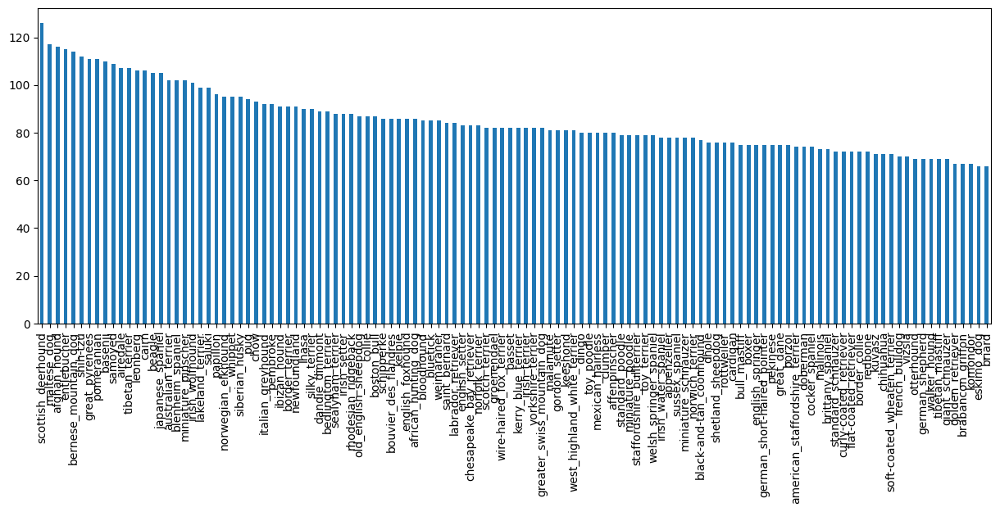

In [ ]:
# How many images of each breed are there?
labels_csv["breed"].value_counts().plot.bar(figsize=(15, 5));

In [20]:
labels_csv["breed"].value_counts().median()

82.0

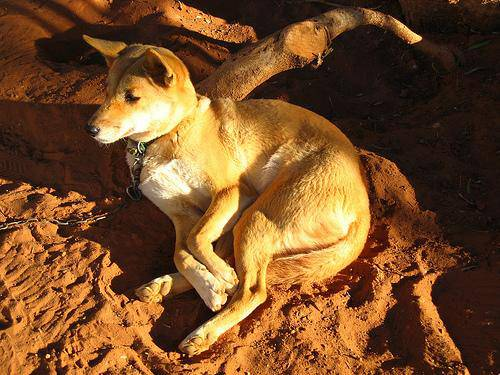

In [ ]:
# Lets view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and there labels

Lets get an list of all of our images file pathnames.

In [21]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/" + fname for fname in labels_csv["id"] + ".jpg"]
filenames

['/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/drive/MyDrive/Colab

In [22]:
# Check whether number of filenames matches the number of actual images files
import os

if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/")) == len(filenames):
  print("Its a match. Proceed!")
else:
  print("Its not a match. Don't proceed!")

Its a match. Proceed!


In [23]:
# One more check
Image(filenames[9000])

TypeError: ignored

In [24]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [25]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does the same this as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [26]:
len(labels)

10222

In [27]:
# See if the number of labels matches the number of filenames

if len(labels) == len(filenames):
  print("It matches.")
else:
  print("Not a match")

It matches.


In [28]:
# Find the unique label value
unique_labels = np.unique(labels)
unique_labels

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn the single labels into an array of booleans
print(labels[0])
labels[0] == unique_labels

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(labels)

10222

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_labels) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Turn every label into boolean array
print(labels[0])     # original label
print(np.where(unique_labels == labels[0]))     # index where label occurs
print(boolean_labels[0].argmax())     # index where labels occurs in boolean array
print(boolean_labels[0].astype(int))  # there will be a 1 if sample occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Since the dataset doesn't have a validation set, we will create one.

In [ ]:
# Setup X and y
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

Lets start with ~1000 images and increase as needed.

In [ ]:
# Set the number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Lets split the data into train and validation sets
from sklearn.model_selection import train_test_split

np.random.seed(42)

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Lets have a peek at the training data
X_train[:2], y_train[:2]

(['/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fa

## Preprocessing Images : Turing images into tensors

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`.
3. Turn out image (.jpg) into Tensors.
4. Resize the `image` to a shape of (224, 224).
5. Return the modified image.

In [ ]:
# Convet and image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# Trun image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Steps to take in the function

Take an image filepath as input
Use Tensorflow to read the file and save it to a variable, `image`.
Turn out image (.jpg) into Tensors.
Resize the `image` to a shape of (224, 224).
Return the modified image.

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes the image file path and turns the image into a tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg into numerical tensor with 3 colour channels (red, blue, green)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to a shape of (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

##Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: (`image, label`).

In [ ]:
# Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
    """
    Takes an image file path name and the assosciated label,
    processes the image and reutrns a typle of (image, label).
    """
    image = process_image(image_path)
    return image, label

In [ ]:
(process_image(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: (`image`, `label`), let's make a function to turn all of our data (`X` & `y`) into batches!

In [ ]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels).
    """
    # If the data is a test dataset, we probably don't have labels.
    if test_data:
        print("Creating TEST data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))     # only filepaths, no labels
        data_batch = data.map(process_image).batch(BATCH_SIZE)
        return data_batch

    # If the data is a valid dataset, we don't need to shuffle it.
    if valid_data:
        print("Creating VALID data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),      # filepaths
                                                   tf.constant(y)))     # labels
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

    else:
        print("Creating training data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),      # filepaths
                                                   tf.constant(y)))     # labels
        # Shuffle pathnames and labels before mapping images processor function
        data = data.shuffle(buffer_size=len(X))

        data = data.map(get_image_label)
        data_batch = data.batch(BATCH_SIZE)
        return data_batch

In [ ]:
# Create validation and training data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating VALID data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images into a data batch
def show_25_images(images, labels):
    """
    Displays a plot of 25 images and their labels from a data batch.
    """
    # Setup a figure
    plt.figure(figsize=(10, 10))
    # Loop through 25 (for displaying 25 images)
    for i in range(25):
        # Craete subplots
        ax = plt.subplot(5, 5, i+1)
        # Display an image
        plt.imshow(images[i])
        # Add the image label as the title
        plt.title(unique_labels[labels[i].argmax()])
        # Turn off grid lines
        plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.35111377, 0.29078463, 0.22079161],
          [0.37168184, 0.31285828, 0.22464456],
          [0.386663  , 0.32815456, 0.20532542],
          ...,
          [0.6949442 , 0.8433336 , 0.886786  ],
          [0.4593615 , 0.51624554, 0.5956507 ],
          [0.50446606, 0.5358386 , 0.6224004 ]],
 
         [[0.30270952, 0.243886  , 0.16449578],
          [0.34350863, 0.28801414, 0.18781623],
          [0.38802245, 0.32951403, 0.19884177],
          ...,
          [0.56625   , 0.71463937, 0.76530474],
          [0.5282379 , 0.59529215, 0.648881  ],
          [0.51744   , 0.5645298 , 0.6163087 ]],
 
         [[0.4325437 , 0.3763637 , 0.2766083 ],
          [0.3919398 , 0.3392801 , 0.2215777 ],
          [0.3574988 , 0.30142152, 0.165887  ],
          ...,
          [0.4255638 , 0.5739532 , 0.6246185 ],
          [0.5512604 , 0.63056284, 0.6450452 ],
          [0.51477736, 0.5777147 , 0.5844368 ]],
 
         ...,
 
         [[0.3674174 , 0.5634959 , 0.17526054],
          [0.32515

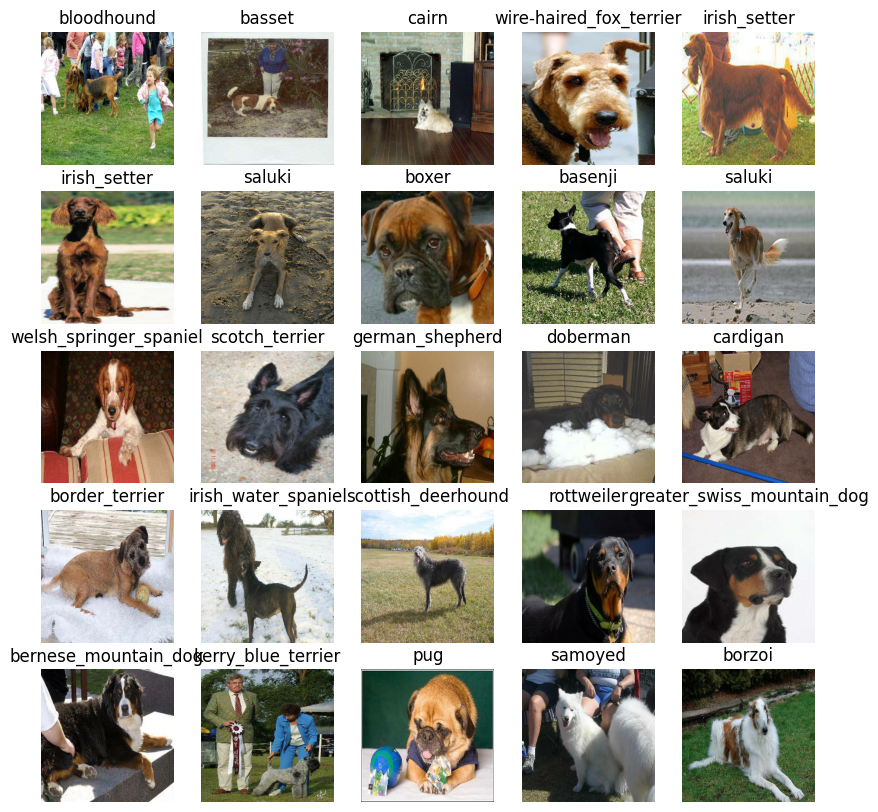

In [ ]:
# Let's visualize the data in a training batch
show_25_images(train_images, train_labels)

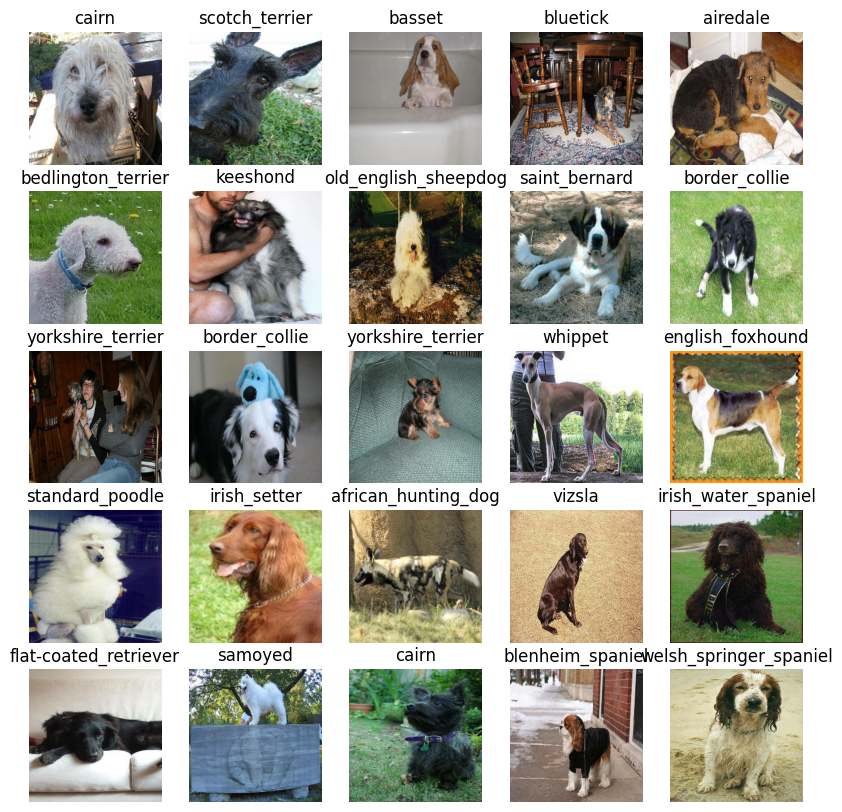

In [ ]:
# Lets visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model
Before we build a model, there are a few things we need to define:

The input shape (our images shape, in the form of Tensors) to our model.
The output shape (image labels, in the form of Tensors) of our model.
The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]     # batch, height, width, colour channel

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_labels)

# Setup model URL from TensorFlow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

We have our input, output and model ready to go.

Let's put them together into a Keras deep learning model!

Create a function which:
* Takes input, output shape and model as parameter of the function
* Defines the layers in the model in sequential way.
* Compiles the model.
* Builds the model (tell the model about the input shape it'll be getting).
* Return the model.

In [ ]:
# Create a function that builds a Keras model
def create_model(input_shape=INPUT_SHAPE, ouput_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with: ", MODEL_URL)

    # Setup the model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
        tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                              activation="softmax") # Layer 2 (output layer)
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    # Build the model
    model.build(INPUT_SHAPE)

    return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1, 1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating Callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
    # Create a log directory for storing TensorBoard logs
    logdir = os.path.join("drive/MyDrive/Colab Notebooks/Dog-Vision/logs",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callbacks

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (subset of data)

Our first model will train only on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running a GPU
print("GPU", "available!" if tf.config.list_physical_devices('GPU') else "not available!")

GPU available!


Create a function to create a model

* Create a model using `create_model`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on the model passing it the training data, validation data, number of epochs to train for `NUM_EPOCHS` and the callbacks.
* Return the model.asdfasdiasasdfasdfasd

In [ ]:
# Build a function to train and return a trained model
def train_model():
    """
    Trains a model on the training data and returns the model.
    """
    # Create model
    model = create_model()

    # Create new TensorBoard session everytime we train model
    tensorboard = create_tensorboard_callback()

    # Fit the model to the data passing it the callbacks we created
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=val_data,
              validation_freq=1,
              callbacks=[tensorboard, early_stopping])

    # Return the fitted model
    return model

In [ ]:
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 132s 4s/step - loss: 4.4687 - accuracy: 0.1050 - val_loss: 3.2977 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 3s 141ms/step - loss: 1.6010 - accuracy: 0.6850 - val_loss: 2.1234 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 3s 112ms/step - loss: 0.5672 - accuracy: 0.9337 - val_loss: 1.6120 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 3s 109ms/step - loss: 0.2549 - accuracy: 0.9850 - val_loss: 1.4348 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 3s 122ms/step - loss: 0.1468 - accuracy: 0.9950 - val_loss: 1.3624 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 3s 105ms/step - loss: 0.1005 - accuracy: 1.0000 - val_loss: 1.3165 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are
some ways to prevent model overfitting in deep learning neural networks?

Note: Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/Dog-Vision/logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 83ms/step


array([[4.8588761e-04, 2.8662460e-05, 1.1801705e-03, ..., 4.5555635e-04,
        1.7935208e-05, 4.2321268e-03],
       [1.8966208e-03, 4.7534276e-04, 4.8946109e-02, ..., 1.5878952e-03,
        2.2644077e-03, 9.9430035e-05],
       [1.0336505e-06, 2.6500772e-06, 3.6658851e-06, ..., 3.9747461e-05,
        4.4697630e-05, 2.7838175e-04],
       ...,
       [1.7586565e-06, 1.3991918e-05, 5.1440540e-05, ..., 9.9704295e-05,
        9.6430966e-05, 1.3007973e-04],
       [5.5640484e-03, 1.6286690e-04, 7.9409161e-05, ..., 8.3634375e-05,
        1.0759830e-04, 7.7512795e-03],
       [6.1142340e-04, 6.7849614e-06, 7.6022616e-04, ..., 1.3668108e-03,
        2.5276971e-04, 1.5836542e-04]], dtype=float32)

In [ ]:
predictions.shape, len(y_val), len(unique_labels)

((200, 120), 200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_labels[np.argmax(predictions[index])]}")

[5.10722639e-05 2.34596009e-05 6.66958367e-05 3.09785173e-05
 1.77508290e-03 2.09401733e-05 7.72877102e-05 7.99512898e-04
 7.17408676e-03 1.97341125e-02 3.44720320e-05 1.65502952e-05
 5.48530079e-04 1.86979724e-03 6.32481533e-04 2.89405766e-03
 1.62606721e-05 2.04836862e-04 8.03865769e-05 6.71358837e-04
 1.00875195e-05 4.69647814e-04 5.69134827e-05 2.91578235e-05
 5.55690052e-03 2.74091417e-05 1.16781166e-05 5.12682418e-05
 3.25067085e-04 6.84682345e-06 2.34090476e-05 1.80017989e-04
 1.94759577e-05 8.62647903e-06 1.13598680e-05 4.99074958e-05
 3.69960937e-04 4.81169060e-04 5.06863689e-05 4.01952684e-01
 6.02517939e-05 7.64897231e-06 2.70289928e-03 2.02448591e-05
 2.55311403e-04 7.03529367e-05 1.21472403e-04 1.02803647e-03
 9.62960548e-05 1.82202610e-04 2.57166739e-05 6.72613896e-05
 1.90158826e-04 6.37747347e-04 4.29578067e-05 2.60293338e-04
 6.68560679e-05 2.21256723e-05 1.35838462e-04 1.76143101e-06
 8.41731016e-05 3.74934869e-04 5.26796794e-06 2.50268804e-05
 1.39964628e-04 1.252207

In [ ]:
unique_labels[113]

'walker_hound'

Having the above functionality is great buts lets do it at scale.

Also, lets see the image the prediction is being made on.

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
    """
    Turns an array of prediction probabilities into a label.
    """
    return unique_labels[np.argmax(prediction_probabilities)]

In [ ]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'golden_retriever'

In [ ]:
unique_labels

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
    """
    Takes a batched dataset of dataset (image, label) Tensors and returns
    seperate arrays of images and labels.
    """
    images_ = []
    labels_ = []

    # Loop through unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
        images_.append(image)
        labels_.append(unique_labels[np.argmax(label)])

    return images_, labels_

#  Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

Now we've got ways to get get:

Prediction labels

Validation labels (truth labels)

Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:

Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅

Convert the prediction probabilities to a predicted label. ✅

Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

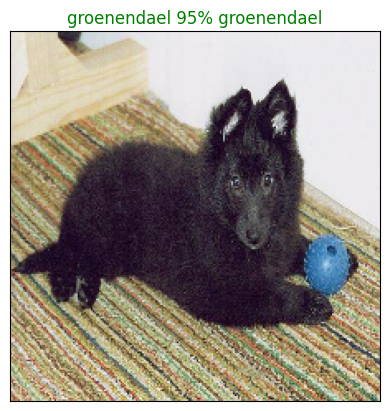

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
    * Prediction probabilities indexes ✅
    * Prediction probabilities values ✅
    * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n):
    """
    Plus the top 10 highest prediction confidences along with the truth label for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find the top 10 prediction labels
    top_10_pred_labels = unique_labels[top_10_pred_indexes]

    # Setup a plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation="vertical")

    # Change color of true label
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
    else:
        pass

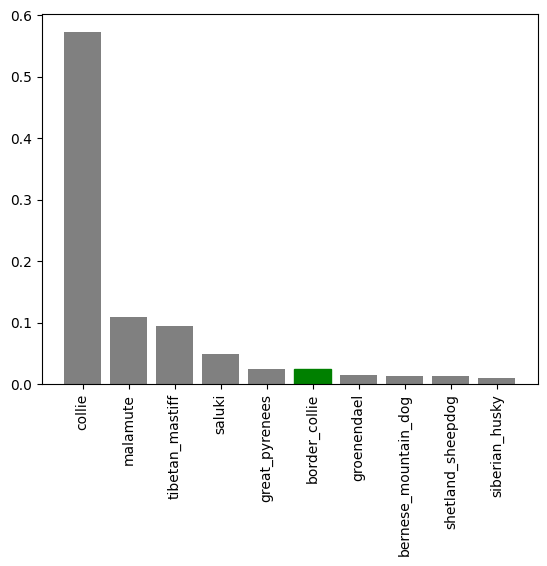

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

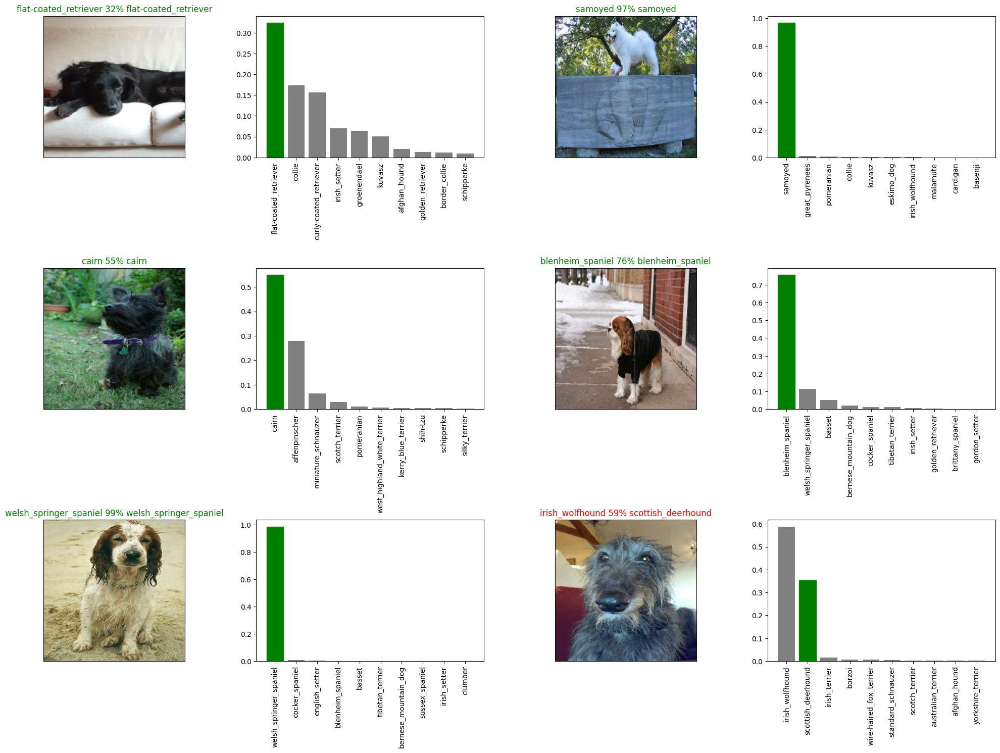

In [ ]:
# Let's checkout a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=val_labels,
                   n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading the model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
    """
    Saves a given model in a models directory and appends a suffix (string).
    """
    modeldir = os.path.join("drive/MyDrive/Colab Notebooks/Dog-Vision/models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    model_path = modeldir + "-" + suffix + ".h5"    # file extension for the model
    print(f"Saving model to : {model_path}...")
    model.save(model_path)
    return model_path

In [7]:
# Create a function to load a trained model
def load_model(model_path):
    """
    Loads a saved model from a specified path.
    """
    print(f"Loading saved model from: {model_path}")
    model = tf.keras.models.load_model(model_path,
                                       custom_objects={"KerasLayer":hub.KerasLayer})
    return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-movilenetv2-Adam")

Saving model to : drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231008-184616-1000-images-movilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231008-184616-1000-images-movilenetv2-Adam.h5'

In [ ]:
# Load the trained model
loaded_1000_images_model = load_model("drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231008-184616-1000-images-movilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231008-184616-1000-images-movilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 80ms/step - loss: 1.1829 - accuracy: 0.6750


[1.182875394821167, 0.675000011920929]

In [ ]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 80ms/step - loss: 1.1829 - accuracy: 0.6750


[1.182875394821167, 0.675000011920929]

## Training a big dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
X_train[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/train/143b9484273e57668d03bfc26755810a.jpg']

In [ ]:
len(X_train), len(y_train)

(800, 800)

In [ ]:
len(X_val), len(y_val)

(200, 200)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy.
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 36s 95ms/step - loss: 1.3513 - accuracy: 0.6639
Epoch 2/100
320/320 [==============================] - 30s 93ms/step - loss: 0.4053 - accuracy: 0.8805
Epoch 3/100
320/320 [==============================] - 30s 94ms/step - loss: 0.2418 - accuracy: 0.9346
Epoch 4/100
320/320 [==============================] - 30s 95ms/step - loss: 0.1556 - accuracy: 0.9633
Epoch 5/100
320/320 [==============================] - 30s 94ms/step - loss: 0.1076 - accuracy: 0.9777
Epoch 6/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0792 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0601 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0475 - accuracy: 0.9937
Epoch 9/100
320/320 [==============================] - 30s 92ms/step - loss: 0.0377 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 31s 97ms/step - l

In [ ]:
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not available")

GPU Available


In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231008-185736-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231008-185736-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231008-185736-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231008-185736-full-image-set-mobilenetv2-Adam.h5


## Making prediction on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image file names
test_path = "/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/55fbea1f92bbc06f3a01d096ed141e6e.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/55f0dac253f7acd1387f3359e9696bc7.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/5617cc7c5d0416aad0cf6b7877ec492e.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/5622f9116dee11e7e4dbc42fd6192b77.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/562428f4ea8cc7915db94bf187f30b58.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/562a38eb3d7ae1ba14840dc16a574d1a.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/563fa10a749b4fb63bb94a3a02a667f5.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/56330333f87bd915763bc6b3ea9a7482.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/5645a15945fe316461377519c9934f47.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/564c005818b5571083b75d4836d45049.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating TEST data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling predict() on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# Make predictions on test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 145s 434ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Colab Notebooks/Dog-Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions[:10]

array([[2.68711386e-09, 1.93324272e-08, 8.95040222e-11, ...,
        2.92962876e-10, 2.65256705e-04, 3.96312494e-09],
       [2.59421568e-10, 3.48693452e-09, 2.47311221e-12, ...,
        6.21623641e-10, 3.15121760e-08, 1.14938921e-08],
       [5.09480769e-09, 4.22621382e-11, 1.92879153e-08, ...,
        5.93747662e-10, 9.82904922e-08, 4.21724572e-10],
       ...,
       [1.12127641e-10, 2.82237585e-13, 4.10752899e-12, ...,
        1.16755303e-12, 1.41996085e-11, 5.32380251e-10],
       [3.45677449e-07, 4.98242550e-12, 5.40755982e-11, ...,
        1.60194871e-10, 3.78630564e-11, 1.41905110e-09],
       [1.01828226e-08, 1.52025541e-05, 2.31585909e-05, ...,
        6.87064752e-02, 1.11183064e-04, 1.65283689e-06]], dtype=float32)

In [ ]:
test_predictions.shape

(10357, 120)

# Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_labels))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames[:5]

['/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/55fbea1f92bbc06f3a01d096ed141e6e.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/55f0dac253f7acd1387f3359e9696bc7.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/5617cc7c5d0416aad0cf6b7877ec492e.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/5622f9116dee11e7e4dbc42fd6192b77.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/test/562428f4ea8cc7915db94bf187f30b58.jpg']

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,55fbea1f92bbc06f3a01d096ed141e6e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,55f0dac253f7acd1387f3359e9696bc7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5617cc7c5d0416aad0cf6b7877ec492e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5622f9116dee11e7e4dbc42fd6192b77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,562428f4ea8cc7915db94bf187f30b58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_labels)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,55fbea1f92bbc06f3a01d096ed141e6e,2.687114e-09,1.933243e-08,8.950402e-11,9.972346e-01,4.387865e-10,2.540443e-08,6.347480e-04,8.232552e-10,2.827263e-11,...,3.942098e-09,4.459951e-09,1.643694e-07,1.483083e-08,1.162620e-09,3.222411e-08,1.667260e-10,2.929629e-10,2.652567e-04,3.963125e-09
1,55f0dac253f7acd1387f3359e9696bc7,2.594216e-10,3.486935e-09,2.473112e-12,1.507771e-09,2.583440e-07,1.561406e-07,1.252277e-10,2.170786e-08,2.160992e-05,...,1.105387e-06,2.901149e-07,1.975189e-08,1.520573e-07,1.404943e-11,8.294183e-05,1.420632e-10,6.216236e-10,3.151218e-08,1.149389e-08
2,5617cc7c5d0416aad0cf6b7877ec492e,5.094808e-09,4.226214e-11,1.928792e-08,1.324283e-12,2.102362e-07,8.705597e-08,1.441109e-11,1.249570e-06,1.615741e-10,...,1.948857e-08,1.208091e-06,1.078584e-10,8.672429e-09,2.500724e-10,7.648985e-09,1.687696e-08,5.937477e-10,9.829049e-08,4.217246e-10
3,5622f9116dee11e7e4dbc42fd6192b77,6.365272e-14,2.457240e-13,1.698088e-14,5.931240e-11,7.311621e-12,1.711500e-12,3.007246e-14,2.537611e-14,5.485104e-14,...,1.139128e-13,6.507051e-11,4.455615e-11,3.545606e-14,1.265907e-10,2.591478e-15,1.012619e-12,1.338726e-12,4.916026e-11,5.108685e-13
4,562428f4ea8cc7915db94bf187f30b58,4.032766e-08,6.550494e-09,1.340393e-08,1.543434e-10,2.004256e-06,2.285854e-08,2.222304e-06,1.192136e-04,1.158134e-07,...,8.722292e-07,6.074198e-08,6.790914e-09,4.736366e-09,1.155054e-09,8.723283e-09,1.588389e-08,1.296499e-09,1.266683e-07,1.564171e-07


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Colab Notebooks/Dog-Vision/full_model_prediction_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get the custom image paths
custom_path = "drive/MyDrive/Colab Notebooks/Dog-Vision/custom images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Colab Notebooks/Dog-Vision/custom images/Tibetan-Mastiff.jpeg',
 'drive/MyDrive/Colab Notebooks/Dog-Vision/custom images/Labrador.jpeg',
 'drive/MyDrive/Colab Notebooks/Dog-Vision/custom images/Pitbull.jpeg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating TEST data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['tibetan_mastiff', 'english_foxhound', 'american_staffordshire_terrier']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

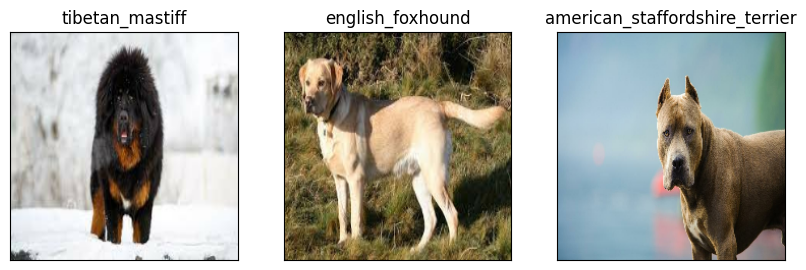

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
    plt.subplot(1, 3, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)